# Project : Exploratory And Data Analysis

---

## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

---

## Data Summary

In [2]:
df = pd.read_csv('./data/combined.csv')
df.head()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,FIRE_NAME,CAUSE,lat,long,GIS_ACRES
0,2008-07,Santa Barbara County,89.129032,59.709677,80.548387,0.0,41.451613,7.354839,0.0,72.937634,34.079570,0.010000,13.164516,no_fire,0.0,34.54,-120.04,0.000000
1,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,SERPENTINE,1.0,38.18,-120.56,176.763400
2,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,POOL 2 - MAIN,10.0,38.18,-120.56,73.444778
3,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,FRENCH,14.0,38.18,-120.56,101.074150
4,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,EVANS,6.0,38.18,-120.56,103.968050


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10988 entries, 0 to 10987
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         10988 non-null  object 
 1   county       10988 non-null  object 
 2   maxtempF     10988 non-null  float64
 3   mintempF     10988 non-null  float64
 4   avgtempF     10988 non-null  float64
 5   totalSnow    10988 non-null  float64
 6   humid        10988 non-null  float64
 7   wind         10988 non-null  float64
 8   precip       10988 non-null  float64
 9   q_avgtempF   10988 non-null  float64
 10  q_avghumid   10988 non-null  float64
 11  q_sumprecip  10988 non-null  float64
 12  sunHour      10988 non-null  float64
 13  FIRE_NAME    10988 non-null  object 
 14  CAUSE        10988 non-null  float64
 15  lat          10988 non-null  float64
 16  long         10988 non-null  float64
 17  GIS_ACRES    10988 non-null  float64
dtypes: float64(15), object(3)
memory usage: 1.5+ M

### Data Dictionary:
|Feature|Type|Description|
|---|---|---|
|**date**|*object*|The month and year of when the fire took place.|
|**county**|*object*|The county the fire started in.|
|**maxtempF**|*float*|The average maximum temperature of that month in °F.|
|**mintempF**|*float*|The average min temperature of that month in °F.|
|**avgtempF**|*float*|The average average temperature of that month in °F.|
|**totalSnow**|*float*|The total snow for that month.|
|**humid**|*float*|The average humidity for that month.|
|**wind**|*float*|The average wind for that month.|
|**precip**|*float*|The average precipitation for that month.|
|**q_avgtempF**|*float*|The quarterly average temperature in °F.|
|**q_avghumid**|*float*|The quarterly average humidity.|
|**q_sumprecip**|*float*|The quarterly average precipitation.|
|**sunHour**|*float*|The average hours of sun for that month.|
|**FIRE_NAME**|*object*|The name of the fire.|
|**CAUSE**|*float*|The cause of the fire.|
|**lat**|*float*|The latitude coordinate of the fire's location.|
|**long**|*float*|The longitude coordinate of the fire's location.|
|**GIS_ACRES**|*float*|The total number of acres burned.|

In [19]:
df.describe()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
count,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,1.098800e+04,10988.000000,10988.000000,10988.000000,10988.000000,1.098800e+04
mean,72.789618,49.036346,64.676692,0.087918,54.408352,5.583294,0.072370,61.760095,57.089738,2.660346e-01,11.292206,2.866582,37.667330,-120.600429,9.799023e+02
std,15.735935,11.425170,14.635490,0.420449,16.926551,1.514516,0.133537,13.136071,15.399669,3.498030e-01,2.113807,4.972688,2.277839,1.963197,1.478595e+04
min,26.214286,0.642857,19.483871,0.000000,10.466667,2.354839,0.000000,22.195853,12.664516,-4.440892e-16,4.800000,0.000000,33.020000,-123.980000,0.000000e+00
25%,61.056452,42.123560,53.870968,0.000000,41.165323,4.533333,0.003226,52.827688,46.095699,4.247312e-02,9.796774,0.000000,36.230000,-122.040000,0.000000e+00
50%,72.951075,49.633333,65.290323,0.000000,54.098387,5.354839,0.020000,61.135663,57.857168,1.354839e-01,11.423333,0.000000,37.930000,-120.720000,0.000000e+00
75%,85.032258,56.677419,75.900806,0.000000,67.903226,6.354839,0.080645,71.280824,69.275627,3.442684e-01,13.274194,2.000000,39.270000,-119.750000,1.393641e+01
max,110.935484,88.935484,102.612903,9.229108,95.935484,14.129032,1.748387,100.311470,93.598694,3.619931e+00,14.500000,19.000000,41.750000,-115.360000,1.032699e+06


---

### 探索與分析
在我們開始尋找和探索火災資料之前，我們需要取得火災發生地點的資料。目前，我們的數據包含發生火災的月份和未發生火災的月份的數據。

為此，我們將對資料套用過濾器，只提供燒毀土地面積（ GIS_ACRES ）大於 zero 的資料；這是因為，如果燒毀的土地面積 zero 英畝，則表示沒有發生火災。

一旦我們完成了這些，我們就可以根據火災燒毀的面積繪製出火災分佈圖。

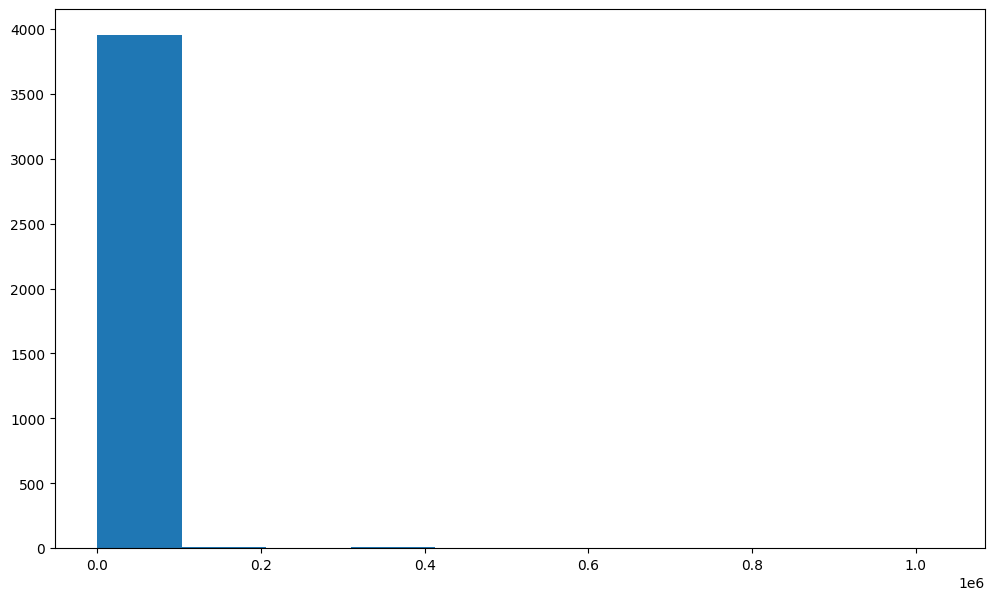

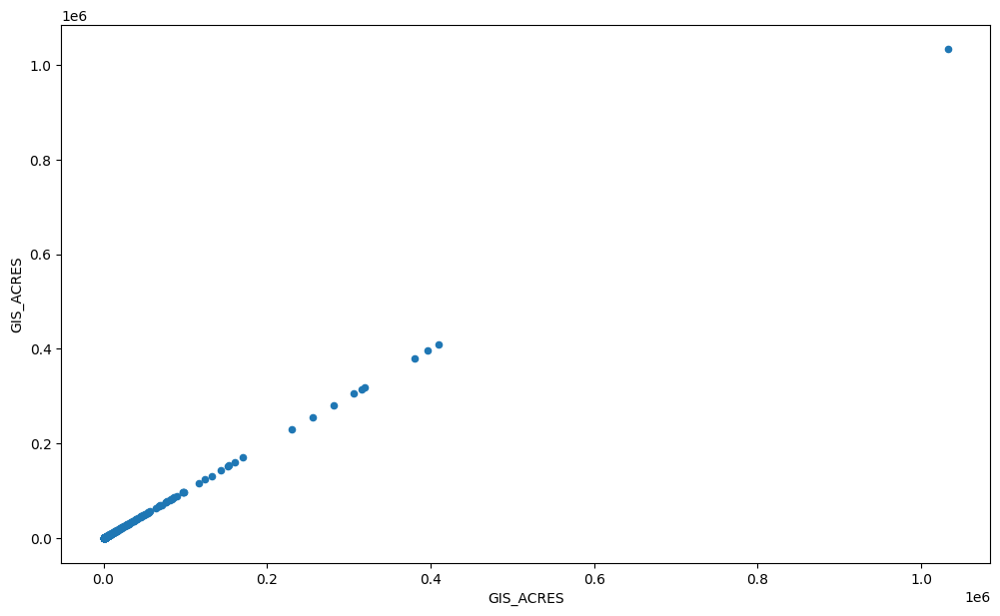

In [20]:
fire_df = df[df['GIS_ACRES'] > 0]

plt.figure(figsize=(12, 7))
plt.hist(fire_df['GIS_ACRES'])
fire_df.plot(kind='scatter', x='GIS_ACRES', y='GIS_ACRES', figsize=(12, 7));

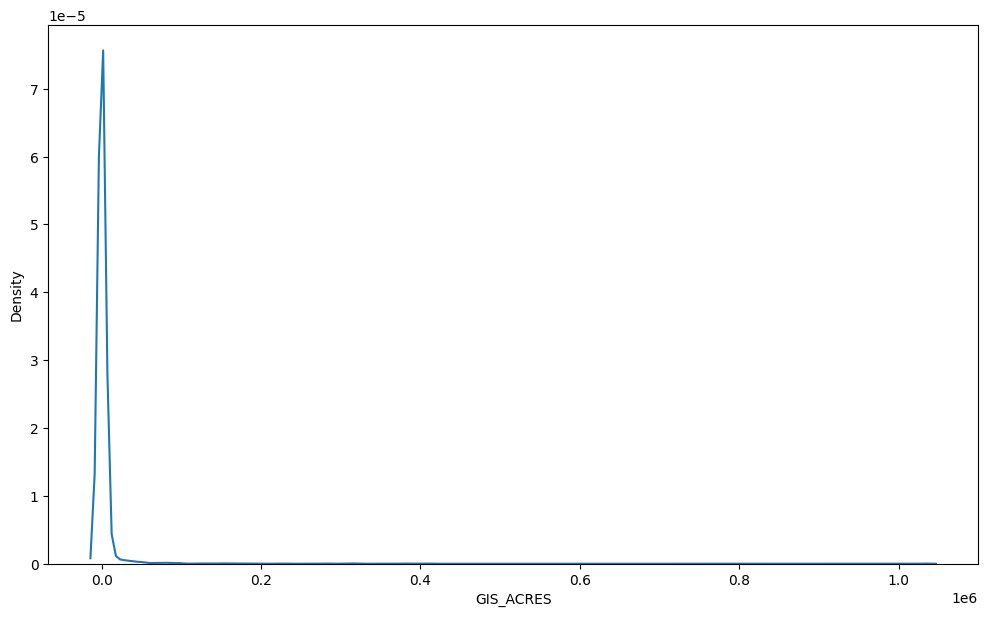

In [26]:

plt.figure(figsize=(12, 7))
sns.distplot(fire_df['GIS_ACRES'], hist=False,);

透過查看描繪燒毀土地面積分佈的三張圖表，我們可以看到，與我們所掌握的異常值相比，大多數火災燒毀的土地面積較少。這意味著我們應該嘗試限制資料的上限，以消除 GIS_ACRES 中的巨大異常值。

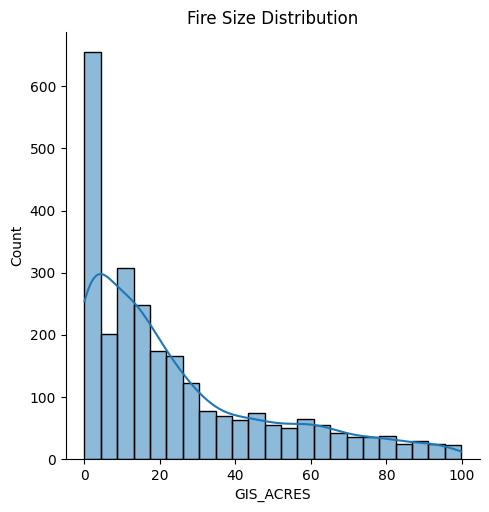

In [29]:
fig_1 = sns.displot(fire_df[fire_df['GIS_ACRES'] < 100]['GIS_ACRES'],
            kde=True,);
fig_1.set(title = "Fire Size Distribution");

我們可以看到，我們的數據中發生的大多數火災燒毀面積不到 100 英畝。接下來我們將把火災資料綁定到：` 0 < GIS_ACRES < 100 `。

In [36]:
fire_df = fire_df[fire_df['GIS_ACRES'] < 100]
fire_df.describe()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
count,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2.624000e+03,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000
mean,81.330914,53.973564,72.604849,0.017671,46.665333,5.187957,0.025802,61.737325,56.939250,2.756160e-01,12.463806,8.269055,37.059695,-120.105572,24.152576
std,11.763966,9.013811,11.026539,0.124869,13.073656,1.270393,0.051299,12.373971,14.901146,3.461555e-01,1.679422,5.286242,2.610631,1.978110,24.709823
min,35.178571,17.964286,28.250000,0.000000,12.766667,2.500000,0.000000,27.922427,13.887097,-8.326673e-17,6.822581,1.000000,33.020000,-123.980000,0.001515
25%,73.800000,48.838710,66.200000,0.000000,37.032258,4.366667,0.000000,52.934581,46.707527,4.537634e-02,11.473333,2.000000,34.360000,-121.340000,4.363766
50%,82.677419,54.000000,74.000000,0.000000,46.700000,4.935484,0.006452,60.799283,57.659498,1.425922e-01,12.503226,9.000000,36.610000,-120.040000,15.401242
75%,89.166667,59.935484,80.133333,0.000000,54.975806,5.800000,0.029032,71.012186,68.579781,3.518433e-01,14.083871,14.000000,39.270000,-118.730000,35.613159
max,108.451613,86.677419,102.064516,2.167894,87.354839,11.433333,0.483871,98.055914,93.598694,3.619931e+00,14.500000,19.000000,41.750000,-115.360000,99.837486


我們可以看到，在將範圍限制為燒毀面積少於 100 英畝的火災後，我們的 `GIS_ACRES` 的標準差急劇下降。我們設法將其從 `14785.95` 減少到 `24.71` ，從而使我們的數據分佈更加均勻。

我們還可以看看火災發生的地點以及它們在地圖上的分佈。僅查看緯度和經度座標很難將其形象化。但是我們可以將這些值與名為 folium 的 Python 函式庫結合使用。 `folium` 是一個允許在互動式地圖上繪製點的函式庫。地圖以 html 格式儲存。

在建立地圖時，我們可以操縱一些東西以使地圖更容易閱讀。當我們在地圖上繪製點時，我們可以按照火災燒毀的面積比例來縮放點的大小。我們還可以為每個點添加文本，以便用戶點擊該點後可以獲得有關火災的更多資訊。 注意 ：下面的地圖包含了資料集中的所有火災，無論火災燒毀了多少英畝。

當您點擊地圖上的某個點時，您可以看到每次火災的原因，這也是一件很有趣的事情。目前，每起火災的原因都是 `int` 變量，用於對每起火災的原因進行分類。下表解釋了各個數字代表的各項原因。

|**Cause #**  | **Description**  |
|---|---|
| **0**  | No fire  |
| **1**  | Lightning  |
| **2**  | Equipment use  |
| **3**  | Smoking  |
| **4**  | Campfire  |
| **5**  | Debris  |
| **6**  | Railroad  |
| **7**  | Arson  |
| **8**  | Playing with fire  |
| **9**  | Miscellaneous  |
| **10**  | Vehicle  |
| **11** | Powerline  |
| **12**| Firefighter training  |
| **13**| Non-firefighter training |
| **14** | Unknown  |
| **15** | Structure|
| **16** | Aircraft|
| **18** | Escaped prescribed burn|
| **19** | Illegal alien campfire|

### Interactive Map

In [9]:
# Creating a copy of the main dataframe.
fire_map_data = df[df['GIS_ACRES'] > 0]

# Changing the cause of the fire from a number to it's corresponding cause.
cause_dict = {1: "Lightning",
              2: "Equipment Use",
              3: "Smoking",
              4: "Campfire",
              5: "Debris",
              6: "Railroad",
              7: "Arson",
              8: "Playing with Fire",
              9: "Miscellaneous",
              10: "Vehicle",
              11: "Powerline",
              12: "Firefighter Training",
              13: "None-Firefighter Training",
              14: "Unknown",
              15: "Structure",
              16: "Aircraft",
              18: "Escaped Prescribed Burn",
              19: "Illegal Alien Campfire"
}

fire_map_data['CAUSE'] = fire_map_data['CAUSE'].map(cause_dict)
fire_map_data.columns = map(str.lower, fire_map_data.columns)

# Setting Up Map Object.
fire_map = folium.Map(location=[37.50, -120.04], zoom_start=6)


# Adding Fires to Map.
for lat, long, cause, acres, date, name in zip(fire_map_data['lat'],
                                         fire_map_data['long'],
                                         fire_map_data['cause'],
                                         fire_map_data['gis_acres'],
                                         fire_map_data['date'],
                                         fire_map_data['fire_name']):
    folium.CircleMarker([lat, long],
                        radius=0.0001 * acres,
                        color = 'red',
                        fill_opacity=0.5,
                        fill=True,
                        popup=folium.Popup(f'<B>Fire Name:</B> {name.title()} <br>'
                                           f'<B>Fire Cause:</B> {cause} <br>'
                                           f'<B>Acres Burned:</B> {acres:.2f} <br>'
                                           f'<B>Date of Fire:</B> {date}',
                                           max_width=1000)
                         ).add_to(fire_map)

fire_map

In [10]:
# RUN THIS CELL ONLY ONCE!!!

# Save interactive fire map to an html file.
fire_map.save('interactive_cali_fire_map.html')

接下來我們可以查看一些 `heatmaps` 來檢查某些變數之間是否存在強相關性。我們也將把它看作一些 `pairplot` 。對於 `pairplot` 我們將其分為兩組圖：月度圖和季度圖。季度數據是根據月度數據計算出來的。

-------------------------------------- Monthly Data Pairplots --------------------------------------


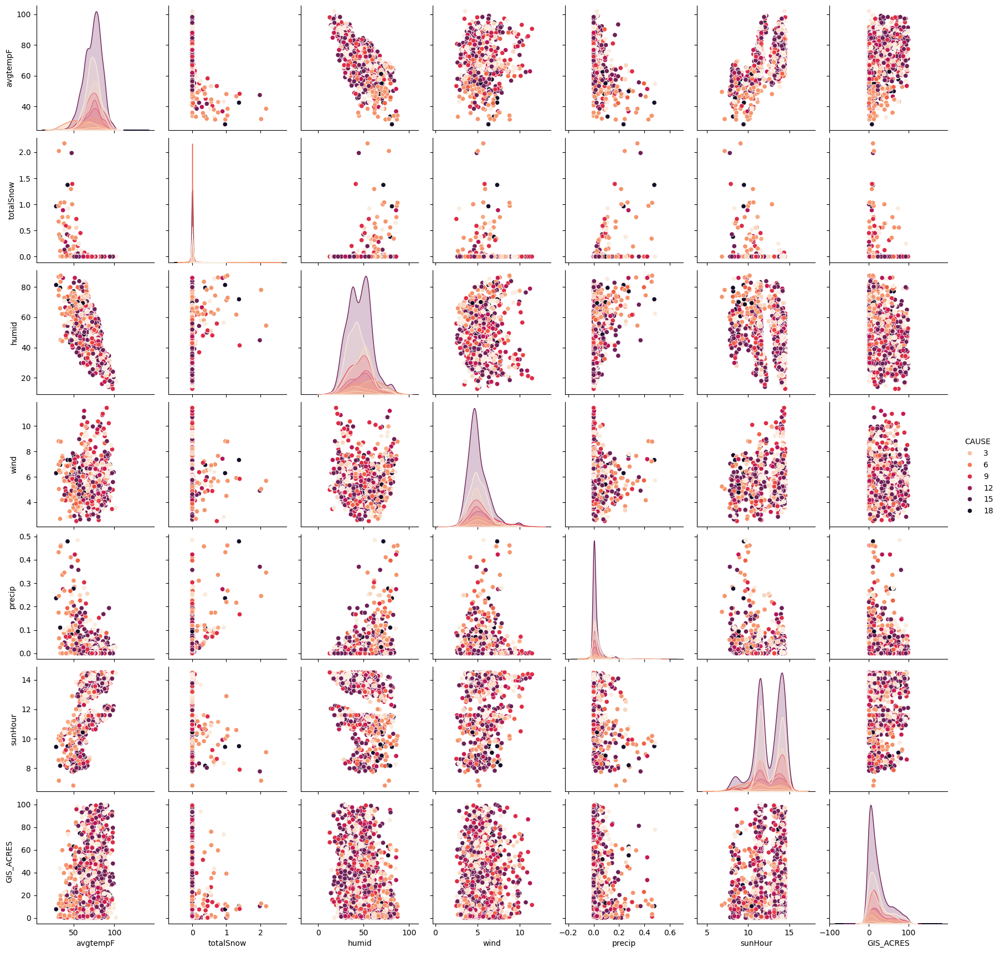

In [11]:
# Creating 2 sets of variables (Monthly and Quarterly)
d_features = ['avgtempF', 'totalSnow', 'humid', 'wind', 'precip', 'sunHour', 'CAUSE', 'GIS_ACRES']
q_features = ['q_avgtempF', 'q_avghumid', 'q_sumprecip', 'wind', 'sunHour', 'CAUSE', 'GIS_ACRES']

# Pairplots
print(f" Monthly Data Pairplots ".center(100, '-'))
sns.pairplot(fire_df[d_features], hue="CAUSE", palette='rocket_r');

------------------------------------- Quarterly Data Pairplots -------------------------------------


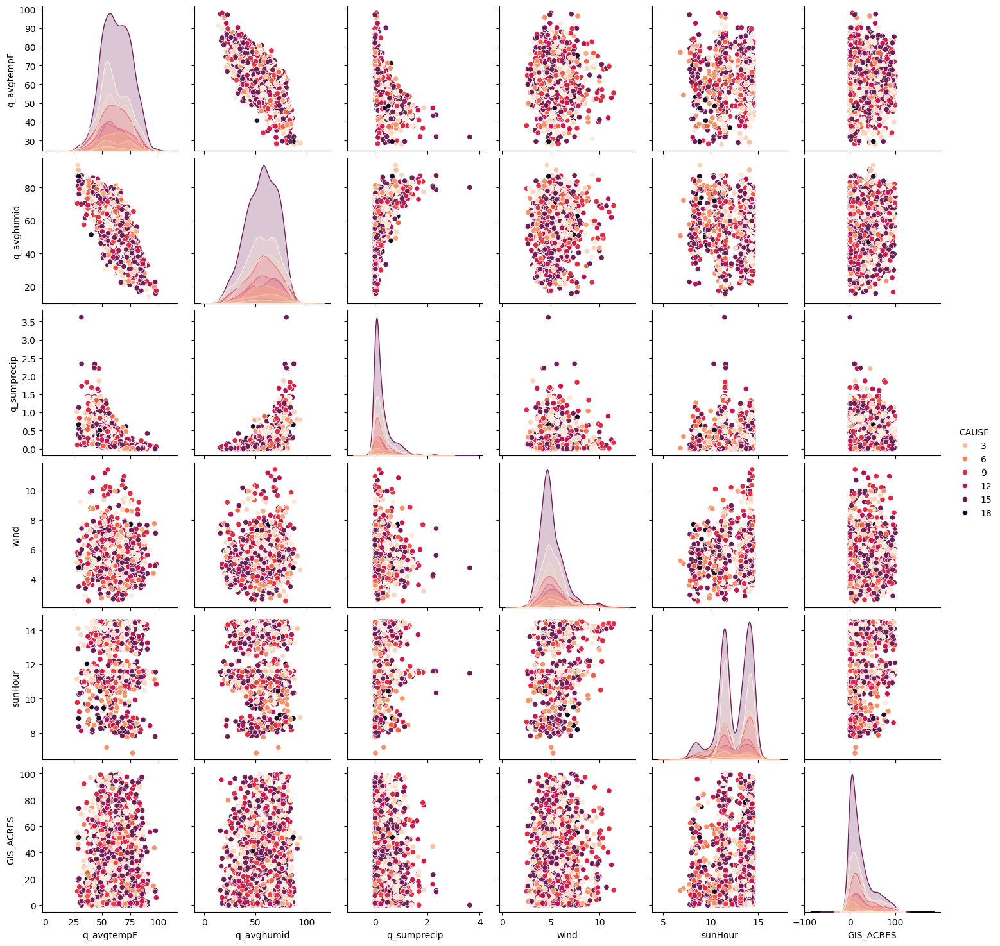

In [12]:
print(f" Quarterly Data Pairplots ".center(100, '-'))
sns.pairplot(fire_df[q_features], hue="CAUSE", palette='rocket_r');

In [ ]:
plt.figure(figsize=(15, 12))
sns.heatmap(fire_df.corr(), vmin=-1, vmax=1, annot=True, cmap='rocket_r');

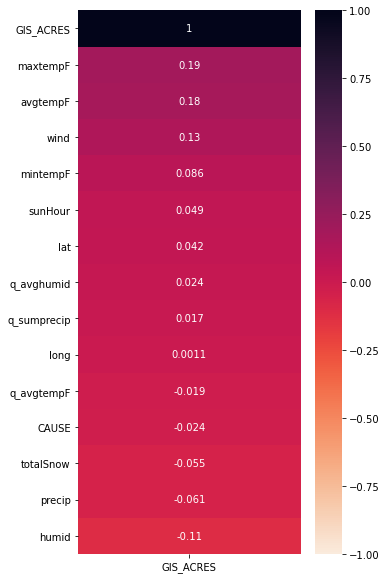

In [ ]:
plt.figure(figsize=(5, 10))
sns.heatmap(fire_df.corr()[['GIS_ACRES']].sort_values(by='GIS_ACRES', ascending=False),
            vmin=-1,
            vmax=1,
            annot=True,
            cmap='rocket_r');

查看這些散佈圖和熱圖，我們可以看到彼此獨立的變數之間沒有真正的強相關性或模式。熱圖中存在一些強相關性，但這是因為變數是相關的（即總雪量和降水量）。

另外，當查看帶有獨立變數的散點圖時，我們看不到清晰的模式或分佈。月度數據和季度數據都是如此。

In [ ]:
fire_df.sort_values(by='GIS_ACRES', ascending=False)[['county', 'FIRE_NAME', 'GIS_ACRES']].head(10)

,county,FIRE_NAME,GIS_ACRES
1827,Riverside County,GILMAN,99.837486
7822,Shasta County,R-3 MUD,99.573639
9543,Santa Barbara County,RANGE,99.083054
2555,Riverside County,CABAZON,98.980995
4373,Napa County,HIGHLAND,98.822746
1378,Kern County,BRAMLETTE,98.147751
3369,Riverside County,FREEWAY,97.775436
6014,Lake County,DEER,97.552078
2455,Riverside County,CAHUILLA,97.545860
6020,Glenn County,36,97.439041


In [ ]:
# Finding Top 10 Fires.
top_10_fires = fire_df.sort_values(by='GIS_ACRES', ascending=False).head(10)
top_10_fires['CAUSE'] = top_10_fires['CAUSE'].map(cause_dict)
top_10_fires.columns = map(str.lower, top_10_fires.columns)

# Setting Up Map Object
fire_map_2 = folium.Map(location=[37.50, -120.04], zoom_start=6)


# Adding Fires to Map.
for lat, long, cause, acres, date, name in zip(top_10_fires['lat'],
                                         top_10_fires['long'],
                                         top_10_fires['cause'],
                                         top_10_fires['gis_acres'],
                                         top_10_fires['date'],
                                         top_10_fires['fire_name']):
    folium.CircleMarker([lat, long],
                        radius=0.25 * acres,
                        color = 'red',
                        fill_opacity=0.5,
                        fill=True,
                        popup=folium.Popup(f'<B>Fire Name:</B> {name.title()} <br>'
                                           f'<B>Fire Cause:</B> {cause} <br>'
                                           f'<B>Acres Burned:</B> {acres:.2f} <br>'
                                           f'<B>Date of Fire:</B> {date}',
                                           max_width=1000)
                         ).add_to(fire_map_2)

fire_map_2

In [ ]:
# Save interactive fire map to an html file.
fire_map_2.save('top_10_interactive_cali_fire_map.html')

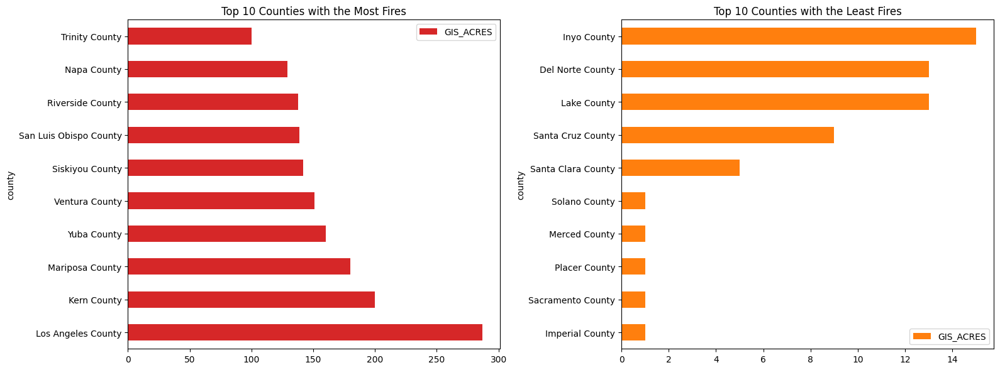

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), tight_layout=True)

(fire_df[['county','GIS_ACRES']]
 .groupby('county')
 .count()
 .sort_values(by='GIS_ACRES', ascending=False)
 .head(10)
 .plot(kind='barh', title='Top 10 Counties with the Most Fires', color='tab:red', ax=axes[0]))

(fire_df[['county','GIS_ACRES']]
 .groupby('county')
 .count()
 .sort_values(by='GIS_ACRES')
 .head(10)
 .plot(kind='barh', title='Top 10 Counties with the Least Fires', color='tab:orange', ax=axes[1]));

最後，讓我們看看哪些縣發生火災最多，哪些縣發生火災最少。如您所見，` Los Angeles County `火災次數最多，而 `Sacramento County `火災次數最少。這可能是因為 Los Angeles 是加州最大的城市。因為人數較多，這意味著火災的可能性較高。